<a href="https://colab.research.google.com/github/BiscuitBobby/BiscuitBobby/blob/main/Image_Upscaler_Colab_(Real_ESRGAN).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 4k Video Upscaler Colab (Real-ESRGAN)

Adapted from: [Real-ESRGAN](https://github.com/xinntao/Real-ESRGAN)

Made with ❤️ by: [yuvraj108c](https://github.com/yuvraj108c)

Github repository: https://github.com/yuvraj108c/4k-video-upscaler-colab

# 1. Setup (~1 minute)

In [1]:
import torch
assert torch.cuda.is_available(), "GPU not detected.. Please change runtime to GPU"

import os

# Clone repository
%cd /content
if not os.path.exists('Real-ESRGAN'):
    !git clone https://github.com/xinntao/Real-ESRGAN.git
%cd Real-ESRGAN

# Install dependencies
!pip install -q basicsr facexlib gfpgan ffmpeg-python
!pip install -q -r requirements.txt
!python setup.py develop

# Robust Patch: Search and replace the broken import in all basicsr files
!find /usr/local/lib/python3.12/dist-packages/basicsr -type f -name "*.py" -exec sed -i 's/torchvision.transforms.functional_tensor/torchvision.transforms.functional/g' {} +

!pip install "numpy<2"
print("Setup complete and basicsr patched!")

/content
/content/Real-ESRGAN
/usr/local/lib/python3.12/dist-packages/setuptools/__init__.py:94: _DeprecatedInstaller: setuptools.installer and fetch_build_eggs are deprecated.
!!

        ********************************************************************************
        Requirements should be satisfied by a PEP 517 installer.
        If you are using pip, you can try `pip install --use-pep517`.
        ********************************************************************************

!!
  dist.fetch_build_eggs(dist.setup_requires)
running develop
/usr/local/lib/python3.12/dist-packages/setuptools/command/develop.py:41: EasyInstallDeprecationWarning: easy_install command is deprecated.
!!

        ********************************************************************************
        Please avoid running ``setup.py`` and ``easy_install``.
        Instead, use pypa/build, pypa/installer or other
        standards-based tools.

        See https://github.com/pypa/setuptools/issues/

Setup complete and basicsr patched!


### 2. Upscale image

- The upscaled image will be saved to `output_dir`.

Testing 0 input
Upscaled image saved to: /content/input_out.jpeg


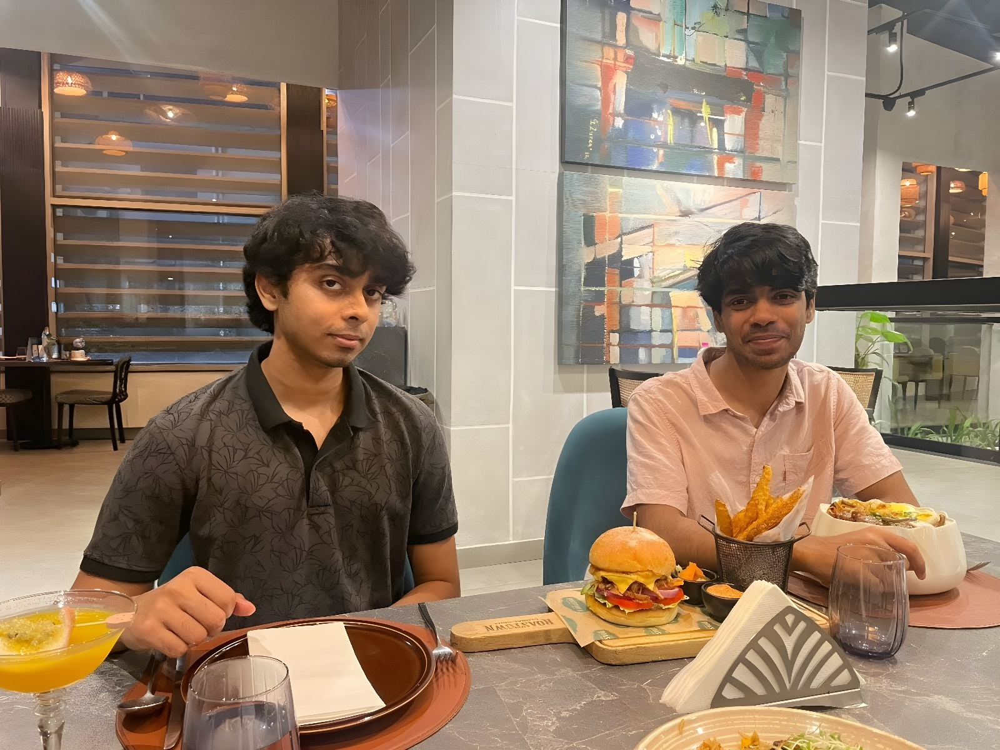

In [3]:
import torch
from PIL import Image
import os

# @markdown ### Image Upscaling Settings
image_path = "/content/input.jpeg" #@param{type:"string"}
output_dir = "/content/" #@param{type:"string"}
model_name = "RealESRGAN_x4plus" #@param ["RealESRGAN_x4plus", "RealESRGAN_x4plus_anime_6B", "realesr-animevideov3"]
outscale = 2 #@param {type:"integer"}

assert os.path.exists(image_path), f"Image file not found at {image_path}"

# The script is located inside the Real-ESRGAN folder
script_path = "/content/Real-ESRGAN/inference_realesrgan.py"

!python3 '{script_path}' -n {model_name} -i '{image_path}' -o '{output_dir}' --outscale {outscale}

# Get output filename
base_name = os.path.splitext(os.path.basename(image_path))[0]
extension = os.path.splitext(os.path.basename(image_path))[1]
# Real-ESRGAN inference appends '_out' to the filename
upscaled_image_path = os.path.join(output_dir, f"{base_name}_out{extension}")

if os.path.exists(upscaled_image_path):
    print(f"Upscaled image saved to: {upscaled_image_path}")
    display(Image.open(upscaled_image_path))
else:
    print("Error: Upscaled image not found. Check the logs above for potential model weight download issues.")

### 3. Model Comparison
Run this cell to compare the output of the general-purpose model versus the anime-optimized model.

Running inference with RealESRGAN_x4plus...
Testing 0 input
Running inference with RealESRGAN_x4plus_anime_6B...
Downloading: "https://github.com/xinntao/Real-ESRGAN/releases/download/v0.2.2.4/RealESRGAN_x4plus_anime_6B.pth" to /content/Real-ESRGAN/weights/RealESRGAN_x4plus_anime_6B.pth

100% 17.1M/17.1M [00:00<00:00, 242MB/s]
Testing 0 input


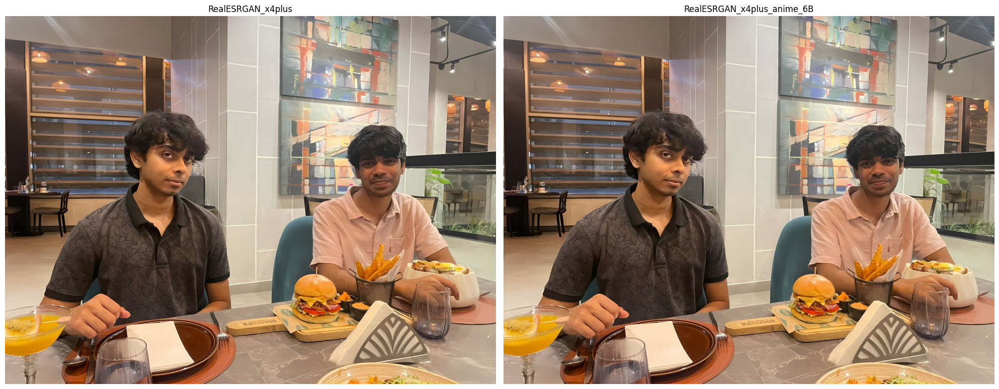

In [4]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Settings
image_path = "/content/input.jpeg"
models_to_test = ["RealESRGAN_x4plus", "RealESRGAN_x4plus_anime_6B"]
results = {}

for m_name in models_to_test:
    print(f"Running inference with {m_name}...")
    !python3 /content/Real-ESRGAN/inference_realesrgan.py -n {m_name} -i '{image_path}' -o '/content/comparison/' --outscale 2

    base = os.path.splitext(os.path.basename(image_path))[0]
    ext = os.path.splitext(os.path.basename(image_path))[1]
    out_path = f"/content/comparison/{base}_out{ext}"
    results[m_name] = out_path

# Display results side-by-side
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
for i, (m_name, path) in enumerate(results.items()):
    if os.path.exists(path):
        img = Image.open(path)
        axes[i].imshow(img)
        axes[i].set_title(m_name)
        axes[i].axis('off')

plt.tight_layout()
plt.show()

### 4. Advanced: Upscale with Face Enhancement
If your image contains faces, this option will use GFPGAN to significantly improve facial details.

Testing 0 input
Upscaling complete! (Face Enhance: False, Scale: 2x)


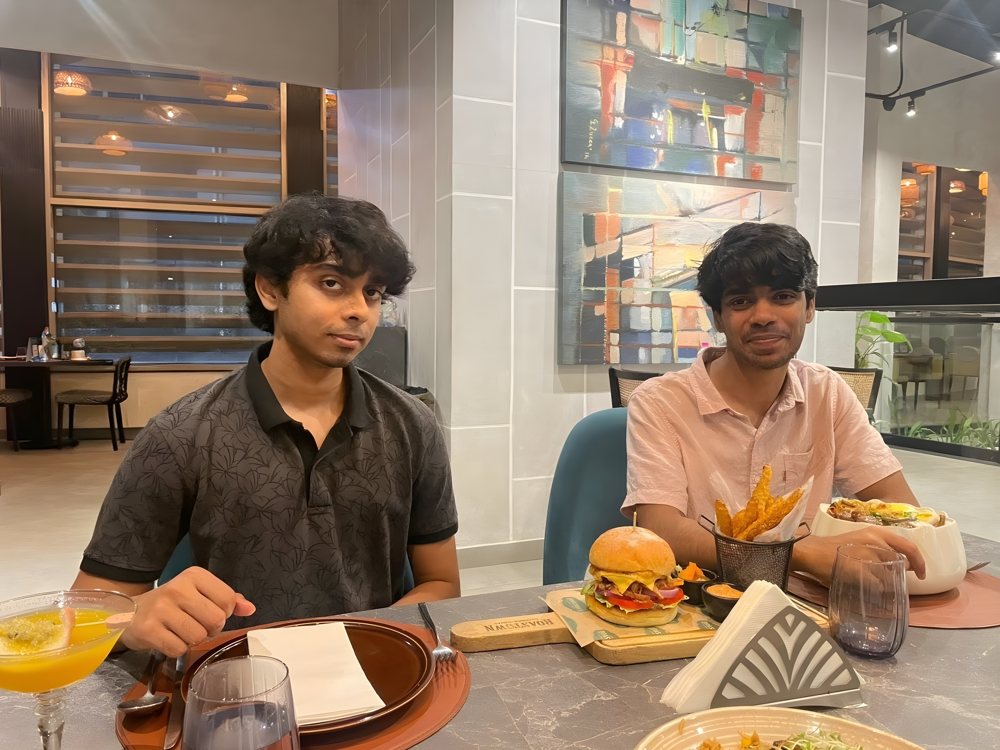

In [6]:
import os
from PIL import Image

# @markdown ### Advanced Upscaling Settings
image_path = "/content/input.jpeg" #@param{type:"string"}
model_name = "RealESRGAN_x4plus" #@param ["RealESRGAN_x4plus", "RealESRGAN_x4plus_anime_6B"]
outscale = 2 #@param {type:"slider", min:1, max:4, step:1}
face_enhance = False #@param {type:"boolean"}

# Construct the command with conditional flags
cmd = f"python3 /content/Real-ESRGAN/inference_realesrgan.py -n {model_name} -i '{image_path}' -o '/content/' --outscale {outscale}"
if face_enhance:
    cmd += " --face_enhance"

# Execute inference
!{cmd}

base = os.path.splitext(os.path.basename(image_path))[0]
ext = os.path.splitext(os.path.basename(image_path))[1]
final_path = f"/content/{base}_out{ext}"

if os.path.exists(final_path):
    print(f"Upscaling complete! (Face Enhance: {face_enhance}, Scale: {outscale}x)")
    display(Image.open(final_path))
else:
    print("Inference failed. Check if the model weights were downloaded correctly.")

# 4. Disconnect runtime

In [ ]:
from google.colab import runtime

disconnect_when_finish = False  #@param{type:"boolean"}

if disconnect_when_finish:
  runtime.unassign()